In [ ]:
import pandas as pd
import numpy as np
import matplotlib as plt
import torch
import torch.optim as optim
import torch.nn.functional as F
import re

In [ ]:
! pip install kagglehub

In [ ]:
import kagglehub
path = kagglehub.dataset_download("yelp-dataset/yelp-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/yelp-dataset


In [ ]:
import os

print("Downloaded files:", os.listdir(path))
for root, dirs, files in os.walk(path):
    print(f"Directory: {root}")
    print(f"Files: {files}")

Downloaded files: ['Dataset_User_Agreement.pdf', 'yelp_academic_dataset_review.json', 'yelp_academic_dataset_checkin.json', 'yelp_academic_dataset_business.json', 'yelp_academic_dataset_tip.json', 'yelp_academic_dataset_user.json']
Directory: /kaggle/input/yelp-dataset
Files: ['Dataset_User_Agreement.pdf', 'yelp_academic_dataset_review.json', 'yelp_academic_dataset_checkin.json', 'yelp_academic_dataset_business.json', 'yelp_academic_dataset_tip.json', 'yelp_academic_dataset_user.json']


In [ ]:
import os
from pathlib import Path
import pandas as pd
import json

path = "/kaggle/input/yelp-dataset"
file_path = Path(path) / "yelp_academic_dataset_review.json"
if not file_path.exists():
    print(f"File not found at: {file_path}")
    raise FileNotFoundError("Could not find the required JSON file.")
else:
    print(f"File found at: {file_path}")

data = []
with open(file_path) as fl:
    for i, line in enumerate(fl):
        data.append(json.loads(line))
        if i + 1 >= 100000:
            break

reviews_df = pd.DataFrame(data)
reviews_df.head()

File found at: /kaggle/input/yelp-dataset/yelp_academic_dataset_review.json


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3.0,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5.0,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3.0,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5.0,1,0,1,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4.0,1,0,1,Cute interior and owner (?) gave us tour of up...,2017-01-14 20:54:15


In [ ]:
import os
from pathlib import Path
import pandas as pd
import json
path = "/kaggle/input/yelp-dataset"
file_path = Path(path) / "yelp_academic_dataset_business.json"
if not file_path.exists():
    print(f"File not found at: {file_path}")
    raise FileNotFoundError("Could not find the required JSON file.")
else:
    print(f"File found at: {file_path}")


data = []
with open(file_path) as fl:
    for i, line in enumerate(fl):
        data.append(json.loads(line))
        if i + 1 >= 500000:
            break

business_df = pd.DataFrame(data)
business_df.head()

File found at: /kaggle/input/yelp-dataset/yelp_academic_dataset_business.json


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."


In [ ]:
# Merge the DataFrames on business_id
data = pd.merge(reviews_df, business_df, on='business_id', how='inner')

In [ ]:
data.shape

(100000, 22)

In [ ]:
data[:1]

,review_id,user_id,business_id,stars_x,useful,funny,cool,text,date,name,...,state,postal_code,latitude,longitude,stars_y,review_count,is_open,attributes,categories,hours
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3.0,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11,Turning Point of North Wales,...,PA,19454,40.210196,-75.223639,3.0,169,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Breakfast & Brunch, Food, Juice B...","{'Monday': '7:30-15:0', 'Tuesday': '7:30-15:0'..."


In [ ]:
def check_business_id_consistency(reviews_df, business_df):
    review_business_ids = set(reviews_df['business_id'].unique())
    business_business_ids = set(business_df['business_id'].unique())
    all_match = review_business_ids == business_business_ids
    in_reviews_not_business = review_business_ids - business_business_ids
    in_business_not_reviews = business_business_ids - review_business_ids

    return {
        'all_business_ids_match': all_match,
        'num_review_only_businesses': len(in_reviews_not_business),
        'num_business_only_businesses': len(in_business_not_reviews),
        'review_df_unique_count': len(review_business_ids),
        'business_df_unique_count': len(business_business_ids)
    }
consistency_report = check_business_id_consistency(reviews_df, business_df)
print(consistency_report)

{'all_business_ids_match': False, 'num_review_only_businesses': 0, 'num_business_only_businesses': 140373, 'review_df_unique_count': 9973, 'business_df_unique_count': 150346}


In [ ]:
business_df.columns

Index(['business_id', 'name', 'address', 'city', 'state', 'postal_code',
       'latitude', 'longitude', 'stars', 'review_count', 'is_open',
       'attributes', 'categories', 'hours'],
      dtype='object')

In [ ]:
business_df["hours"]

,hours
0,None
1,"{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,"{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,"{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,"{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."
...,...
150341,"{'Monday': '10:0-19:30', 'Tuesday': '10:0-19:3..."
150342,"{'Monday': '9:30-17:30', 'Tuesday': '9:30-17:3..."
150343,None
150344,"{'Monday': '9:0-20:0', 'Tuesday': '9:0-20:0', ..."


In [ ]:
business_df["categories"]

,categories
0,"Doctors, Traditional Chinese Medicine, Naturop..."
1,"Shipping Centers, Local Services, Notaries, Ma..."
2,"Department Stores, Shopping, Fashion, Home & G..."
3,"Restaurants, Food, Bubble Tea, Coffee & Tea, B..."
4,"Brewpubs, Breweries, Food"
...,...
150341,"Nail Salons, Beauty & Spas"
150342,"Pets, Nurseries & Gardening, Pet Stores, Hobby..."
150343,"Shopping, Jewelry, Piercing, Toy Stores, Beaut..."
150344,"Fitness/Exercise Equipment, Eyewear & Optician..."


In [ ]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler

features = business_df[['latitude', 'longitude', 'stars', 'review_count']]
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(features)

In [ ]:
restaurants = business_df[business_df['categories'].str.contains('Restaurant', case=False, na=False)].copy()
coords = restaurants[['latitude', 'longitude']].values

In [ ]:
! pip install torch_geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 48.5 MB/s eta 0:00:00


In [ ]:
import torch
import torch_geometric
from torch_geometric.data import Data
from sklearn.neighbors import radius_neighbors_graph

restaurants = business_df[business_df['categories'].str.contains('restaurant', case=False, na=False)].copy()

features = restaurants[['latitude', 'longitude', 'stars', 'review_count']]
features = (features - features.mean()) / features.std()

coords = restaurants[['latitude', 'longitude']].values
adj = radius_neighbors_graph(coords, radius=0.005, metric='haversine')
edge_index = torch.tensor(adj.nonzero(), dtype=torch.long)

data = Data(
    x=torch.tensor(features.values, dtype=torch.float),
    edge_index=edge_index,
    y=torch.tensor(restaurants['stars'].values, dtype=torch.float)
)

<ipython-input-12-bc201d3cbccd>:16: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:254.)
  edge_index = torch.tensor(adj.nonzero(), dtype=torch.long)


In [ ]:
import torch
import numpy as np
import torch.nn as nn
from torch_geometric.data import Data
from torch_geometric.nn import GATv2Conv
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
from torch.optim.lr_scheduler import ReduceLROnPlateau
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler

def prepare_data(business_df, k_neighbors=15):
    restaurants = business_df[business_df['categories'].str.contains('restaurant', case=False, na=False)].copy()
    restaurants = restaurants.dropna(subset=['latitude', 'longitude', 'stars', 'review_count'])
    features = restaurants[['latitude', 'longitude', 'review_count']]
    features['log_review_count'] = np.log1p(features['review_count'])
    features = features[['latitude', 'longitude', 'log_review_count']]
    scaler = StandardScaler()
    X_normalized = scaler.fit_transform(features)

    coords = restaurants[['latitude', 'longitude']].values
    adj = kneighbors_graph(coords, n_neighbors=k_neighbors, metric='haversine')
    edge_index = torch.tensor(adj.nonzero(), dtype=torch.long)

    y = (restaurants['stars'].values - 1) / 4

    data = Data(
        x=torch.tensor(X_normalized, dtype=torch.float),
        edge_index=edge_index,
        y=torch.tensor(y, dtype=torch.float).view(-1, 1)
    )

    return data, restaurants

class RestaurantGAT(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = GATv2Conv(3, 8, heads=2, edge_dim=1)
        self.conv2 = GATv2Conv(8*2, 8, heads=1)
        self.regressor = torch.nn.Sequential(
            nn.Linear(8, 4),
            nn.ReLU(),
            nn.Linear(4, 1),
            nn.Sigmoid()
        )

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        row, col = edge_index
        edge_attr = torch.norm(data.x[row][:,:2] - data.x[col][:,:2], dim=1).unsqueeze(1)

        x = self.conv1(x, edge_index, edge_attr=edge_attr).relu()
        x = self.conv2(x, edge_index).relu()
        return self.regressor(x)

def train_model(data, restaurants, n_epochs=50):
    train_idx, val_idx = train_test_split(range(len(restaurants)), test_size=0.2, random_state=42)
    data.train_mask = torch.zeros(len(restaurants), dtype=torch.bool)
    data.train_mask[train_idx] = True
    data.val_mask = torch.zeros(len(restaurants), dtype=torch.bool)
    data.val_mask[val_idx] = True

    model = RestaurantGAT()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
    scheduler = ReduceLROnPlateau(optimizer, 'min', patience=10, factor=0.5, verbose=True)

    best_val_loss = float('inf')
    patience = 10
    no_improve = 0

    for epoch in range(n_epochs):
        model.train()
        optimizer.zero_grad()

        out = model(data)
        loss = torch.nn.functional.huber_loss(out[data.train_mask], data.y[data.train_mask])
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 0.5)
        optimizer.step()

        # Validation
        model.eval()
        with torch.no_grad():
            val_out = model(data)
            val_loss = torch.nn.functional.huber_loss(val_out[data.val_mask], data.y[data.val_mask])

        scheduler.step(val_loss)

        # Early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            no_improve = 0
            torch.save(model.state_dict(), 'best_model.pt')
        else:
            no_improve += 1
            if no_improve >= patience:
                print(f"\nEarly stopping at epoch {epoch}")
                break

        pred_ratings = out.detach().cpu().numpy() * 4 + 1
        true_ratings = data.y.cpu().numpy() * 4 + 1

        train_mae = mean_absolute_error(true_ratings[data.train_mask], pred_ratings[data.train_mask])
        val_mae = mean_absolute_error(true_ratings[data.val_mask], pred_ratings[data.val_mask])

        print(f"Epoch {epoch:02d} | "
              f"Loss: {loss.item():.4f} | "
              f"Val Loss: {val_loss.item():.4f} | "
              f"Train MAE: {train_mae:.3f} | "
              f"Val MAE: {val_mae:.3f} | "
              f"LR: {optimizer.param_groups[0]['lr']:.5f}")

    model.load_state_dict(torch.load('best_model.pt'))
    return model

#Run Pipeline
data, restaurants = prepare_data(business_df, k_neighbors=15)
model = train_model(data, restaurants)

<ipython-input-15-953b80c4f19a>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features['log_review_count'] = np.log1p(features['review_count'])
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 00 | Loss: 0.0373 | Val Loss: 0.0358 | Train MAE: 0.948 | Val MAE: 0.941 | LR: 0.01000
Epoch 01 | Loss: 0.0361 | Val Loss: 0.0346 | Train MAE: 0.930 | Val MAE: 0.924 | LR: 0.01000
Epoch 02 | Loss: 0.0348 | Val Loss: 0.0333 | Train MAE: 0.910 | Val MAE: 0.904 | LR: 0.01000
Epoch 03 | Loss: 0.0334 | Val Loss: 0.0320 | Train MAE: 0.889 | Val MAE: 0.884 | LR: 0.01000
Epoch 04 | Loss: 0.0321 | Val Loss: 0.0306 | Train MAE: 0.866 | Val MAE: 0.862 | LR: 0.01000
Epoch 05 | Loss: 0.0306 | Val Loss: 0.0291 | Train MAE: 0.844 | Val MAE: 0.840 | LR: 0.01000
Epoch 06 | Loss: 0.0291 | Val Loss: 0.0276 | Train MAE: 0.820 | Val MAE: 0.817 | LR: 0.01000
Epoch 07 | Loss: 0.0276 | Val Loss: 0.0262 | Train MAE: 0.796 | Val MAE: 0.794 | LR: 0.01000
Epoch 08 | Loss: 0.0260 | Val Loss: 0.0249 | Train MAE: 0.773 | Val MAE: 0.773 | LR: 0.01000
Epoch 09 | Loss: 0.0246 | Val Loss: 0.0237 | Train MAE: 0.749 | Val MAE: 0.750 | LR: 0.01000
Epoch 10 | Loss: 0.0234 | Val Loss: 0.0229 | Train MAE: 0.723 | Val MA

In [ ]:

with torch.no_grad():
    predictions = model(data).cpu().numpy() * 4 + 1  # Convert back to 1-5 scale

restaurants['predicted_stars'] = predictions
restaurants['residual'] = restaurants['stars'] - restaurants['predicted_stars']
restaurants['anomaly_score'] = restaurants['residual'] * np.log1p(restaurants['review_count'])

top_anomalies = restaurants[restaurants['anomaly_score'] > restaurants['anomaly_score'].quantile(0.95)]
print("\nTop Anomalies:")
print(top_anomalies[['name', 'stars', 'predicted_stars', 'residual', 'address']].sort_values('residual', ascending=False).head(10))


Top Anomalies:
                                     name  stars  predicted_stars  residual  \
21388                First Stop Bake Shop    5.0         3.263706  1.736294   
116426  el sabor mexican and chinese food    5.0         3.265728  1.734272   
84448                       El Mr Camaron    5.0         3.265910  1.734090   
112103                 Cul de Sac Kitchen    5.0         3.266693  1.733307   
78978                  Real McCoy’s Grill    5.0         3.270706  1.729294   
30981                       Donut Delight    5.0         3.271339  1.728661   
5133           Katsumi's Teaching Kitchen    5.0         3.274979  1.725021   
26935              The Corner Street Food    5.0         3.278784  1.721216   
27135                  Roy's Meat Service    5.0         3.279156  1.720844   
149015                          Baba Xavi    5.0         3.283215  1.716785   

                              address  
21388                611 E Airline Dr  
116426        6010 Madison Ave, St

In [ ]:

city_anomalies = top_anomalies['city'].value_counts().reset_index()
city_anomalies.columns = ['City', 'Anomaly Count']
city_anomalies['Total Restaurants'] = restaurants['city'].value_counts().loc[city_anomalies['City']].values
city_anomalies['Anomaly Rate'] = city_anomalies['Anomaly Count'] / city_anomalies['Total Restaurants']
print("\nTop Cities by Anomaly Concentration:")
print(city_anomalies.sort_values('Anomaly Rate', ascending=False).head(10))


Top Cities by Anomaly Concentration:
                 City  Anomaly Count  Total Restaurants  Anomaly Rate
321      St.  Charles              1                  1           1.0
301        East Falls              1                  1           1.0
304            DELRAN              1                  1           1.0
298       Palm harbor              1                  1           1.0
246       Wallingford              1                  1           1.0
265          Bucktown              1                  1           1.0
277            St.Ann              1                  1           1.0
203              Balm              1                  1           1.0
202         Glenoldan              1                  1           1.0
215  LOWER PROVIDENCE              1                  1           1.0


In [ ]:
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

print("\n=== Anomaly Overview ===")
print(f"Total restaurants analyzed: {len(restaurants)}")
print(f"Number of anomalies detected: {len(top_anomalies)} ({len(top_anomalies)/len(restaurants):.1%})")
print(f"Average stars for anomalies: {top_anomalies['stars'].mean():.2f} vs overall: {restaurants['stars'].mean():.2f}")
print(f"Average review count for anomalies: {top_anomalies['review_count'].mean():.0f} vs overall: {restaurants['review_count'].mean():.0f}")



=== Anomaly Overview ===
Total restaurants analyzed: 52286
Number of anomalies detected: 2615 (5.0%)
Average stars for anomalies: 4.60 vs overall: 3.52
Average review count for anomalies: 285 vs overall: 87


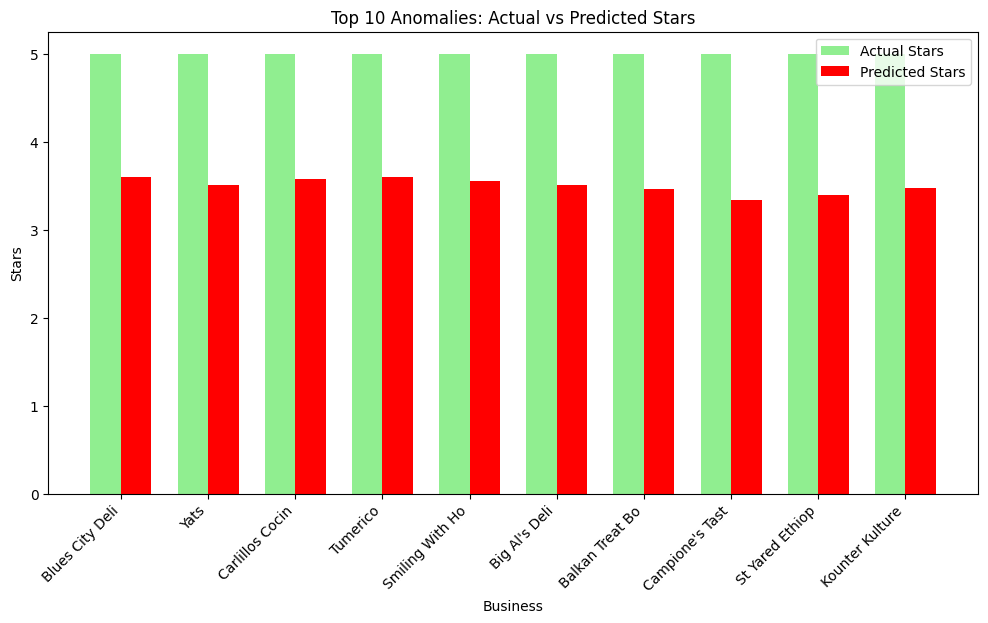

In [ ]:
plt.figure(figsize=(12,6))

top_5_anomalies = top_anomalies.sort_values('anomaly_score', ascending=False).head(10)
indices = range(len(top_5_anomalies))
bar_width = 0.35
plt.bar(
    [i - bar_width/2 for i in indices],
    top_5_anomalies['stars'],
    bar_width,
    label='Actual Stars',
    color='lightgreen'
)
plt.bar(
    [i + bar_width/2 for i in indices],
    top_5_anomalies['predicted_stars'],
    bar_width,
    label='Predicted Stars',
    color='red'
)
plt.xlabel('Business')
plt.ylabel('Stars')
plt.title('Top 10 Anomalies: Actual vs Predicted Stars')
plt.xticks(indices, top_5_anomalies['name'].str[:15], rotation=45, ha='right')
plt.legend()

In [ ]:

if 'business_id' not in restaurants.columns:
    restaurants = restaurants.merge(business_df[['business_id']], left_index=True, right_index=True)
top_20_anomalies = restaurants.nlargest(20, 'anomaly_score')
top_20_business_ids = top_20_anomalies['business_id'].tolist()
print("Business IDs of Top 20 Anomalies:")
for i, business_id in enumerate(top_20_business_ids, 1):
    print(f"{i}. {business_id}")
top_20_anomalies[['business_id', 'name', 'stars', 'predicted_stars', 'residual', 'anomaly_score']].to_csv('top_20_anomalies.csv', index=False)

Business IDs of Top 20 Anomalies:
1. _aKr7POnacW_VizRKBpCiA
2. gP_oWJykA2RocIs_GurKWQ
3. 8QqnRpM-QxGsjDNuu0E57A
4. DVBJRvnCpkqaYl6nHroaMg
5. OR7VJQ3Nk1wCcIbPN4TCQQ
6. xBPg6gzunjpEUT6FiRrpog
7. sWwVGF9k30IDE4Lpa-XM8g
8. oLOVznE7BzEqwVK3Yim_gQ
9. SK8mugK0lNcb0okR5pQ8pQ
10. SFN5g5eexukcaZkzoiYQYg
11. 0I9XZD7JTqY9iTF8nXRnXw
12. celJoKvziNB7tgeih7NIbg
13. 6OwxdpajDSJi3DkMqkr2sw
14. emrUsUZvqCkytUu4i3kjLw
15. 3NmMVlz6sFsBJsVaPtm12A
16. tARR9jhv5gi9TjsfSVmjmw
17. 4bNFWpQtS5PtfjXuxTc-GQ
18. ez3QHFQDCbdhzBtU58dbKg
19. BZyxr4ocl1hJvFvhlogz0Q
20. FHDuu5Mv1bEkusxEuhptZQ


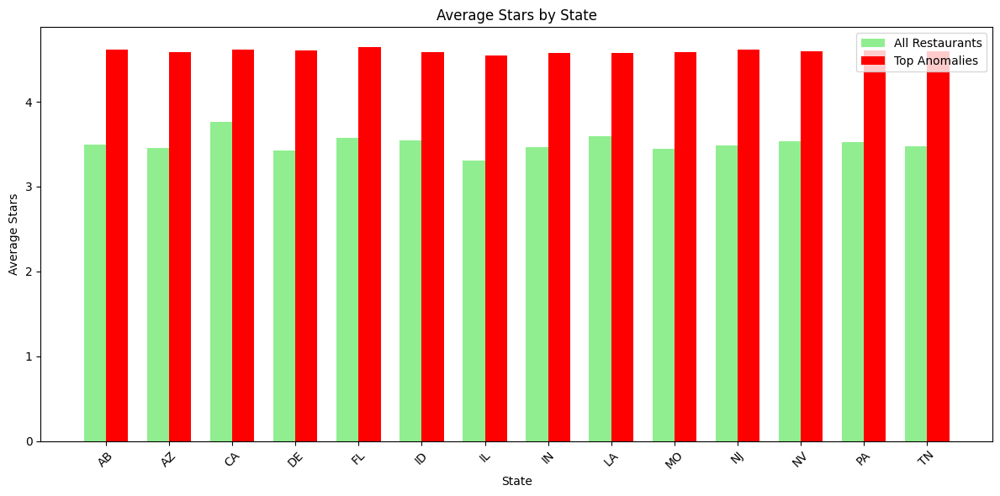

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(12,6))
anomaly_states = top_anomalies['state'].unique()
state_stars = restaurants[restaurants['state'].isin(anomaly_states)].groupby('state')['stars'].mean()
anomaly_stars = top_anomalies.groupby('state')['stars'].mean()
bar_width = 0.35
indices = range(len(state_stars))
plt.bar(
    [i - bar_width/2 for i in indices],
    state_stars,
    bar_width,
    label='All Restaurants',
    color='lightgreen'
)
plt.bar(
    [i + bar_width/2 for i in indices],
    anomaly_stars.reindex(state_stars.index, fill_value=0),
    bar_width,
    label='Top Anomalies',
    color='red'
)
plt.xlabel('State')
plt.ylabel('Average Stars')
plt.title('Average Stars by State')
plt.xticks(indices, state_stars.index, rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

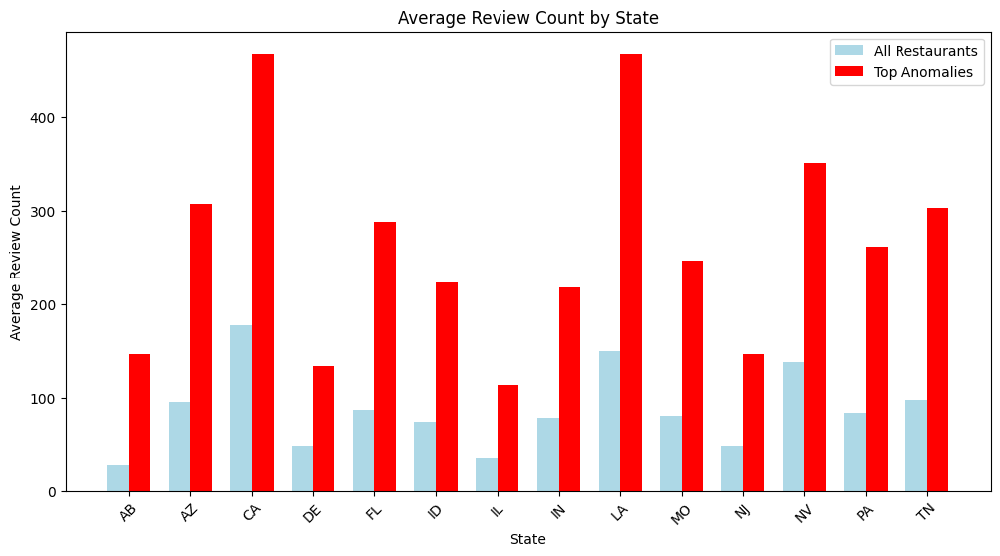

In [ ]:

plt.figure(figsize=(12,6))
anomaly_states = top_anomalies['state'].unique()
state_reviews = restaurants[restaurants['state'].isin(anomaly_states)].groupby('state')['review_count'].mean()
anomaly_reviews = top_anomalies.groupby('state')['review_count'].mean()

indices = range(len(state_reviews))
plt.bar(
    [i - bar_width/2 for i in indices],
    state_reviews,
    bar_width,
    label='All Restaurants',
    color='lightblue'
)
plt.bar(
    [i + bar_width/2 for i in indices],
    anomaly_reviews.reindex(state_reviews.index, fill_value=0),
    bar_width,
    label='Top Anomalies',
    color='red'
)
plt.xlabel('State')
plt.ylabel('Average Review Count')
plt.title('Average Review Count by State')
plt.xticks(indices, state_reviews.index, rotation=45)
plt.legend()

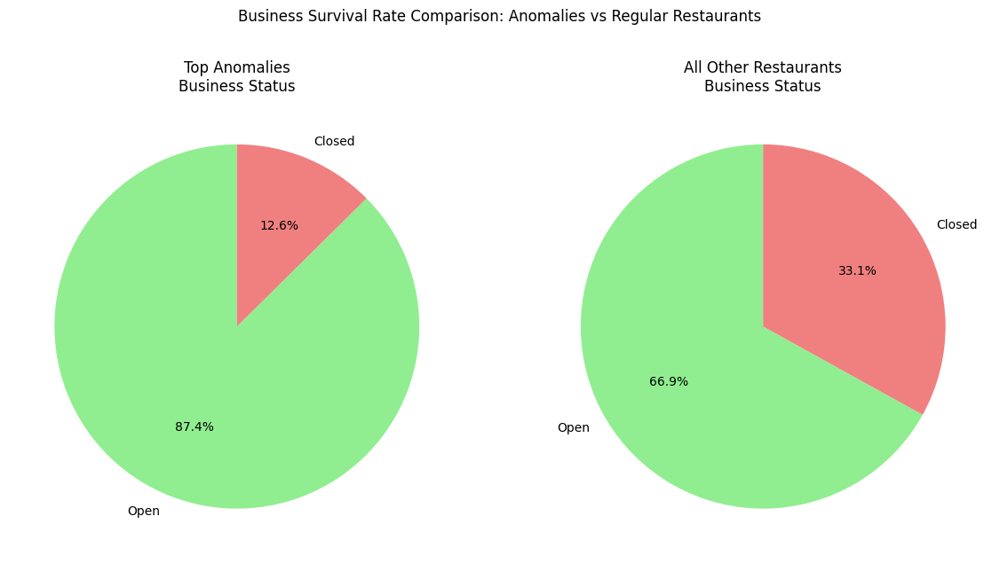

<Figure size 1000x600 with 0 Axes>

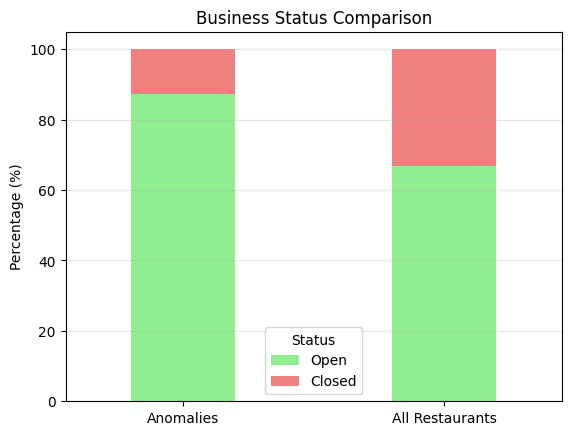

In [ ]:

status_comparison = pd.DataFrame({
    'Anomalies': top_anomalies['is_open'].value_counts(),
    'All Restaurants': restaurants['is_open'].value_counts()
}).fillna(0)

status_comparison = status_comparison / status_comparison.sum() * 100

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

ax1.pie(
    status_comparison['Anomalies'],
    labels=['Open' if x == 1 else 'Closed' for x in status_comparison.index],
    autopct='%1.1f%%',
    colors=['lightgreen', 'lightcoral'],
    startangle=90
)
ax1.set_title('Top Anomalies\nBusiness Status')

ax2.pie(
    status_comparison['All Restaurants'],
    labels=['Open' if x == 1 else 'Closed' for x in status_comparison.index],
    autopct='%1.1f%%',
    colors=['lightgreen', 'lightcoral'],
    startangle=90
)
ax2.set_title('All Other Restaurants\nBusiness Status')

plt.suptitle('Business Survival Rate Comparison: Anomalies vs Regular Restaurants', y=1.05)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
status_comparison.T.plot(kind='bar', stacked=True, color=['lightgreen', 'lightcoral'], width=0.4)
plt.ylabel('Percentage (%)')
plt.title('Business Status Comparison')
plt.xticks(rotation=0)
plt.legend(title='Status', labels=['Open', 'Closed'])
plt.grid(axis='y', alpha=0.3)
plt.show()

<ipython-input-24-9d3e9776eeae>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


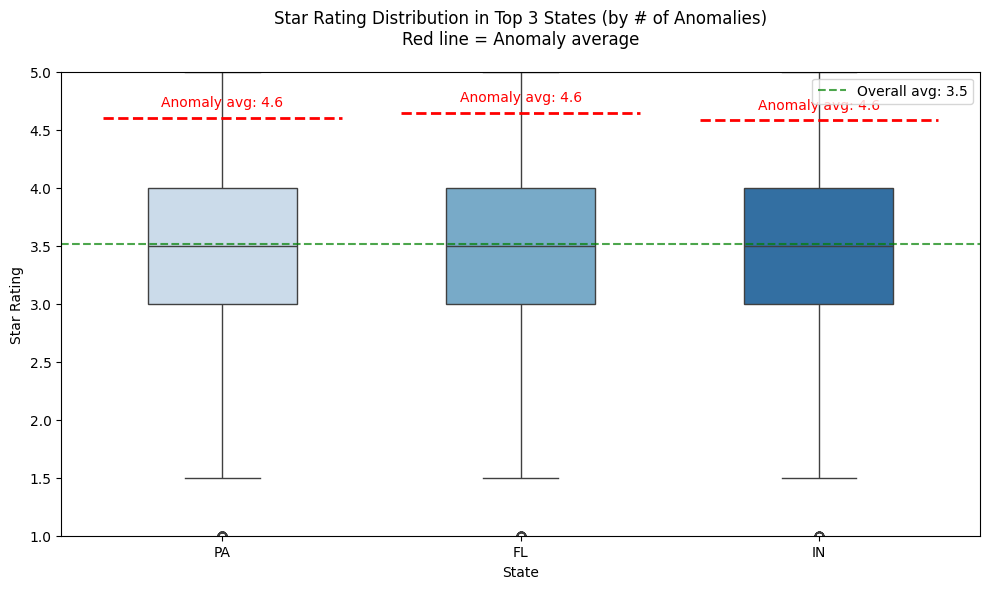

In [ ]:

top_states = top_anomalies['state'].value_counts().head(3).index.tolist()

state_data = restaurants[restaurants['state'].isin(top_states)]

plt.figure(figsize=(10, 6))
sns.boxplot(
    data=state_data,
    x='state',
    y='stars',
    order=top_states,
    palette='Blues',
    width=0.5
)

for i, state in enumerate(top_states):
    avg_anomaly_stars = top_anomalies[top_anomalies['state'] == state]['stars'].mean()

    plt.hlines(
        y=avg_anomaly_stars,
        xmin=i-0.4,
        xmax=i+0.4,
        colors='red',
        linestyles='dashed',
        linewidth=2
    )
    plt.text(
        x=i,
        y=avg_anomaly_stars+0.1,
        s=f'Anomaly avg: {avg_anomaly_stars:.1f}',
        color='red',
        ha='center'
    )

overall_avg = restaurants['stars'].mean()
plt.axhline(
    y=overall_avg,
    color='green',
    linestyle='--',
    alpha=0.7,
    label=f'Overall avg: {overall_avg:.1f}'
)

plt.title('Star Rating Distribution in Top 3 States (by # of Anomalies)\nRed line = Anomaly average', pad=20)
plt.xlabel('State')
plt.ylabel('Star Rating')
plt.ylim(1, 5)
plt.legend(loc='upper right')

plt.tight_layout()
plt.show()

In [ ]:

unique_categories = set()
for categories in top_anomalies['categories'].dropna():

    cats = [cat.strip() for cat in categories.split(',')]
    unique_categories.update(cats)

unique_categories = sorted(unique_categories)

print("Unique Categories in Top Anomalies:")
for cat in unique_categories:
    print(f"- {cat}")

Unique Categories in Top Anomalies:
- Acai Bowls
- Accessories
- Active Life
- Adult Entertainment
- Afghan
- African
- American (New)
- American (Traditional)
- Arabic
- Arcades
- Argentine
- Armenian
- Art Galleries
- Art Museums
- Art Tours
- Arts & Crafts
- Arts & Entertainment
- Asian Fusion
- Australian
- Austrian
- Auto Glass Services
- Auto Repair
- Automotive
- Bagels
- Bakeries
- Barbeque
- Bars
- Bartenders
- Basque
- Beaches
- Beauty & Spas
- Beer
- Beer Bar
- Beer Gardens
- Beer Tours
- Belgian
- Beverage Store
- Bike Repair/Maintenance
- Bistros
- Books
- Bookstores
- Botanical Gardens
- Brasseries
- Brazilian
- Breakfast & Brunch
- Breweries
- Brewpubs
- Bridal
- British
- Bubble Tea
- Buddhist Temples
- Buffets
- Burgers
- Burmese
- Butcher
- CSA
- Cafes
- Cafeteria
- Cajun/Creole
- Calabrian
- Cambodian
- Canadian (New)
- Candy Stores
- Cannabis Clinics
- Cantonese
- Caribbean
- Casinos
- Caterers
- Champagne Bars
- Cheese Shops
- Cheesesteaks
- Chicken Shop
- Chicken 

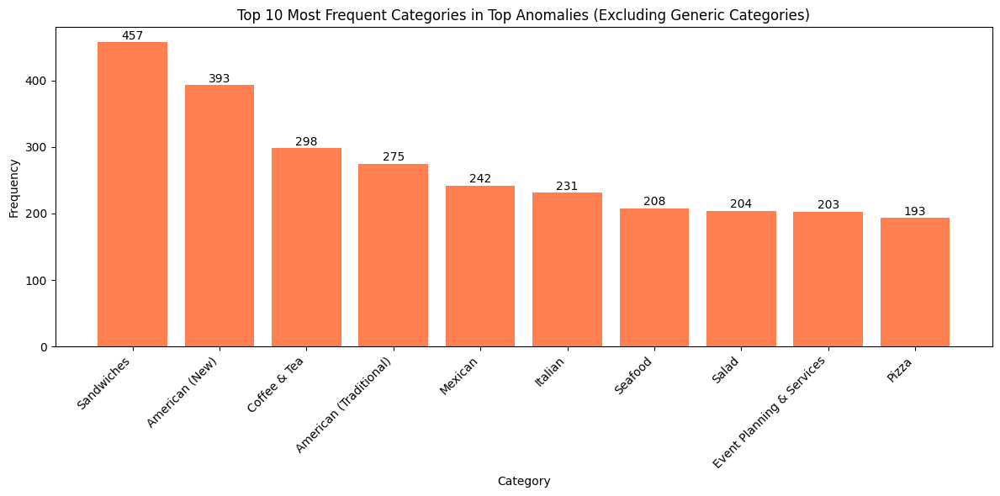

Top 10 Most Frequent Categories in Anomalies:
Category                       Frequency  Percentage
--------------------------------------------------
Sandwiches                     457        17.48%
American (New)                 393        15.03%
Coffee & Tea                   298        11.40%
American (Traditional)         275        10.52%
Mexican                        242        9.25%
Italian                        231        8.83%
Seafood                        208        7.95%
Salad                          204        7.80%
Event Planning & Services      203        7.76%
Pizza                          193        7.38%


In [ ]:

from collections import Counter

exclude_categories = {"Restaurants", "Food", "Nightlife", "Cafes", "Bars", "Breakfast & Brunch"}

category_counts = Counter()
for categories in top_anomalies['categories'].dropna():
    cats = [cat.strip() for cat in categories.split(',') if cat.strip() not in exclude_categories]
    category_counts.update(cats)


top_10_categories = category_counts.most_common(10)


if top_10_categories:
    categories, counts = zip(*top_10_categories)
else:
    categories, counts = [], []
plt.figure(figsize=(12, 6))
plt.bar(categories, counts, color='coral')
plt.xlabel('Category')
plt.ylabel('Frequency')
plt.title('Top 10 Most Frequent Categories in Top Anomalies (Excluding Generic Categories)')
plt.xticks(rotation=45, ha='right')
for i, count in enumerate(counts):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom')
plt.tight_layout()
plt.show()

# Print the frequencies for reference
print("Top 10 Most Frequent Categories in Anomalies:")
print(f"{'Category':<30} {'Frequency':<10} {'Percentage':<10}")
print("-" * 50)
total_anomalies = len(top_anomalies)
for category, count in top_10_categories:
    percentage = (count / total_anomalies) * 100 if total_anomalies > 0 else 0
    print(f"{category:<30} {count:<10} {percentage:.2f}%")

In [ ]:

fig = px.scatter_mapbox(top_anomalies,
                        lat="latitude",
                        lon="longitude",
                        hover_name="name",
                        hover_data=["stars", "predicted_stars", "residual", "review_count"],
                        color="residual",
                        color_continuous_scale=px.colors.sequential.Viridis,
                        zoom=10)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(title="Spatial Distribution of Anomalies (Size = Review Count)")
fig.show()

In [ ]:

fig = px.scatter_mapbox(top_anomalies,
                        lat="latitude",
                        lon="longitude",
                        hover_name="name",
                        hover_data={
                            "stars": ":.1f",
                            "predicted_stars": ":.1f",
                            "residual": ":.2f",
                            "review_count": True,
                            "latitude": False,
                            "longitude": False
                        },
                        color="stars",
                        color_continuous_scale=px.colors.sequential.Plasma_r,
                        range_color=[3.5, 5],
                        size=np.log(top_anomalies['review_count']+1),
                        size_max=10,
                        zoom=10,
                        title="Top-Rated Restaurant Anomalies<br><sup>Circle size = Review count | Darker color = Higher star rating</sup>")


fig.update_layout(
    mapbox_style="open-street-map",
    coloraxis_colorbar=dict(
        title="Star Rating",
        thickness=20,
        len=0.75,
        yanchor="middle",
        y=0.5
    ),
    margin={"r":0,"t":60,"l":0,"b":0},
    hoverlabel=dict(
        bgcolor="white",
        font_size=10,
        font_family="Arial"
    )
)

fig.add_annotation(
    x=0.05,
    y=0.05,
    xref="paper",
    yref="paper",

    showarrow=False,
    bgcolor="white",
    bordercolor="black",
    borderwidth=1
)

fig.show()

***Moving to generic geo-spatial analysis***

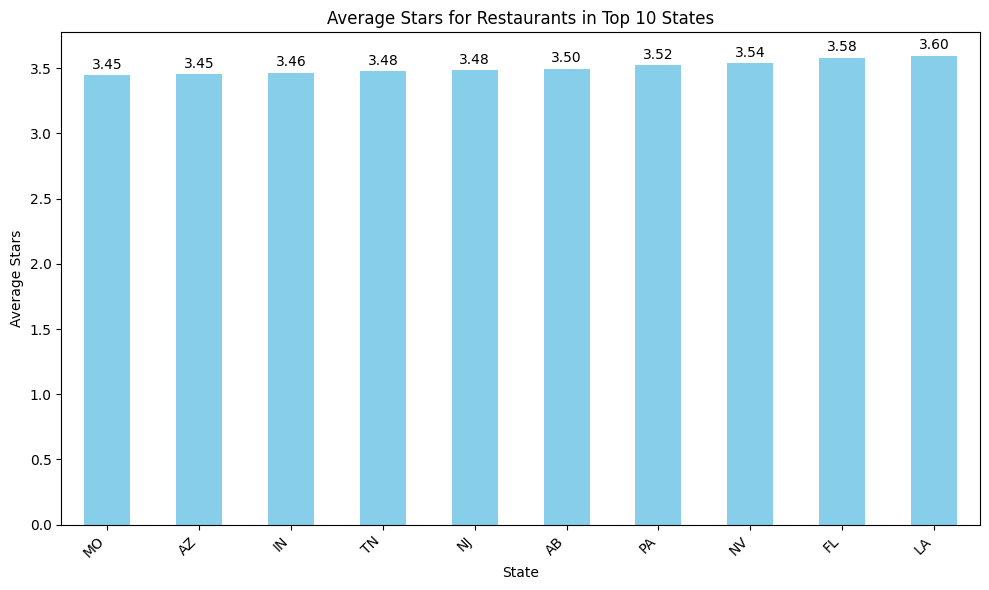

In [ ]:

restaurants_df = business_df[business_df["categories"].str.contains("Restaurants", na=False, case=False)].copy()

top_states = restaurants_df["state"].value_counts().head(10).index
state_stars = restaurants_df[restaurants_df["state"].isin(top_states)].groupby("state")["stars"].mean()

# Bar plot
plt.figure(figsize=(10, 6))
state_stars.sort_values().plot(kind="bar", color="skyblue")
plt.xlabel("State")
plt.ylabel("Average Stars")
plt.title("Average Stars for Restaurants in Top 10 States")
plt.xticks(rotation=45, ha="right")
for i, v in enumerate(state_stars.sort_values()):
    plt.text(i, v + 0.05, f"{v:.2f}", ha="center")
plt.tight_layout()
plt.show()

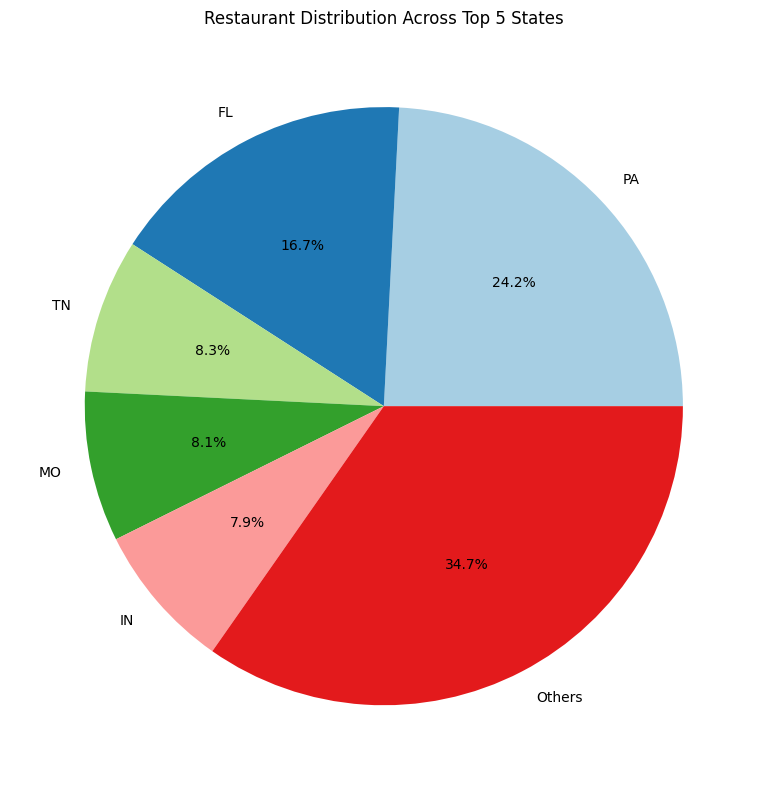

In [ ]:

restaurants_df = business_df[business_df["categories"].str.contains("Restaurants", na=False, case=False)].copy()

top_states = restaurants_df["state"].value_counts().head(5)
others = restaurants_df["state"].value_counts()[5:].sum()
pie_data = pd.concat([top_states, pd.Series({"Others": others})])
plt.figure(figsize=(8, 8))
plt.pie(pie_data, labels=pie_data.index, autopct="%1.1f%%", colors=plt.cm.Paired(range(len(pie_data))))
plt.title("Restaurant Distribution Across Top 5 States")
plt.tight_layout()
plt.show()

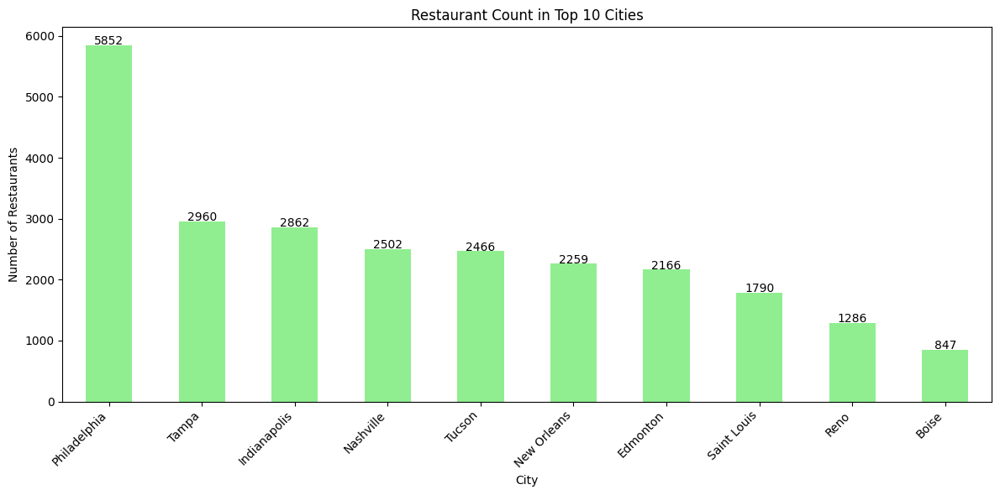

In [ ]:

restaurants_df = business_df[business_df["categories"].str.contains("Restaurants", na=False, case=False)].copy()
top_cities = restaurants_df["city"].value_counts().head(10).index
city_counts = restaurants_df[restaurants_df["city"].isin(top_cities)]["city"].value_counts()
plt.figure(figsize=(12, 6))
city_counts.plot(kind="bar", color="lightgreen")
plt.xlabel("City")
plt.ylabel("Number of Restaurants")
plt.title("Restaurant Count in Top 10 Cities")
plt.xticks(rotation=45, ha="right")
for i, v in enumerate(city_counts):
    plt.text(i, v + 10, str(v), ha="center")
plt.tight_layout()
plt.show()

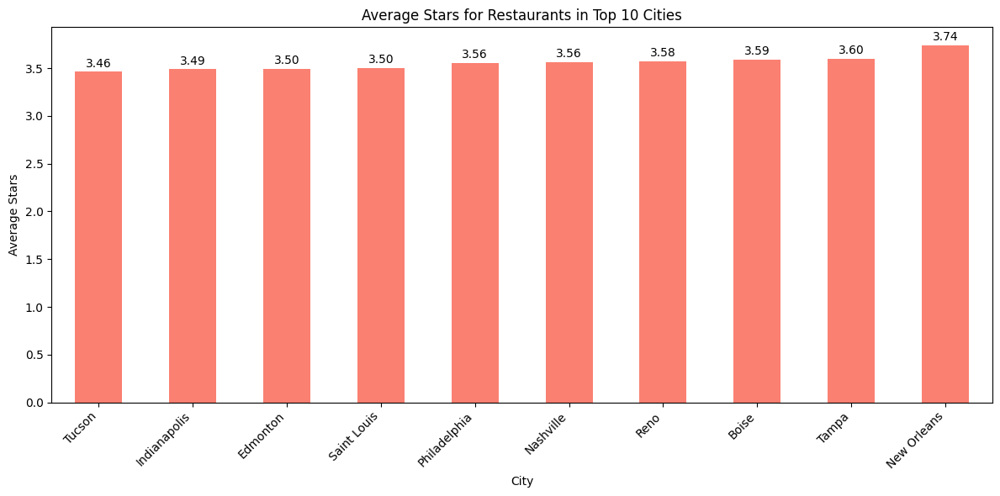

In [ ]:

restaurants_df = business_df[business_df["categories"].str.contains("Restaurants", na=False, case=False)].copy()

top_cities = restaurants_df["city"].value_counts().head(10).index
city_stars = restaurants_df[restaurants_df["city"].isin(top_cities)].groupby("city")["stars"].mean()
plt.figure(figsize=(12, 6))
city_stars.sort_values().plot(kind="bar", color="salmon")
plt.xlabel("City")
plt.ylabel("Average Stars")
plt.title("Average Stars for Restaurants in Top 10 Cities")
plt.xticks(rotation=45, ha="right")
for i, v in enumerate(city_stars.sort_values()):
    plt.text(i, v + 0.05, f"{v:.2f}", ha="center")
plt.tight_layout()
plt.show()

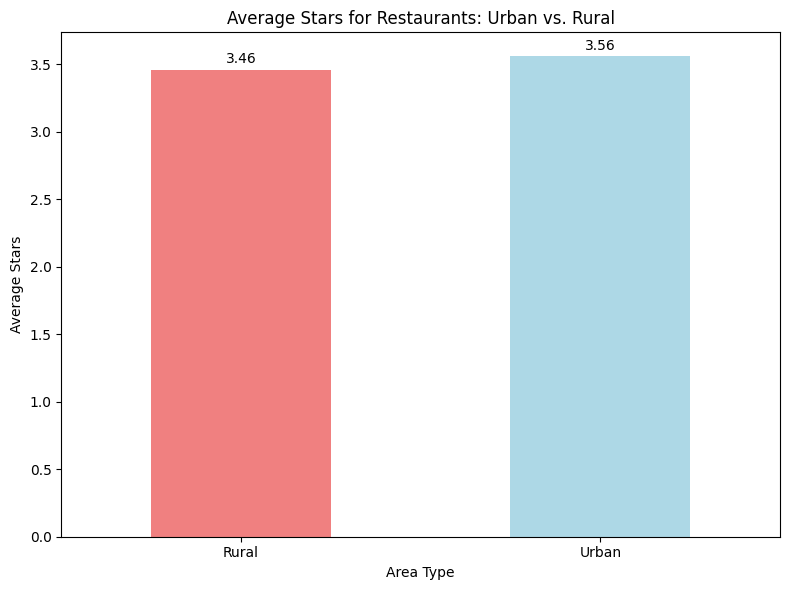

In [ ]:

restaurants_df = business_df[business_df["categories"].str.contains("Restaurants", na=False, case=False)].copy()

city_counts = restaurants_df["city"].value_counts()
restaurants_df["density"] = restaurants_df["city"].map(city_counts)
restaurants_df["area_type"] = restaurants_df["density"].apply(lambda x: "Urban" if x > 300 else "Rural")
area_stars = restaurants_df.groupby("area_type")["stars"].mean()
plt.figure(figsize=(8, 6))
area_stars.plot(kind="bar", color=["lightcoral", "lightblue"])
plt.xlabel("Area Type")
plt.ylabel("Average Stars")
plt.title("Average Stars for Restaurants: Urban vs. Rural")
plt.xticks(rotation=0)
for i, v in enumerate(area_stars):
    plt.text(i, v + 0.05, f"{v:.2f}", ha="center")
plt.tight_layout()
plt.show()

<ipython-input-59-9bf049e20fbc>:15: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




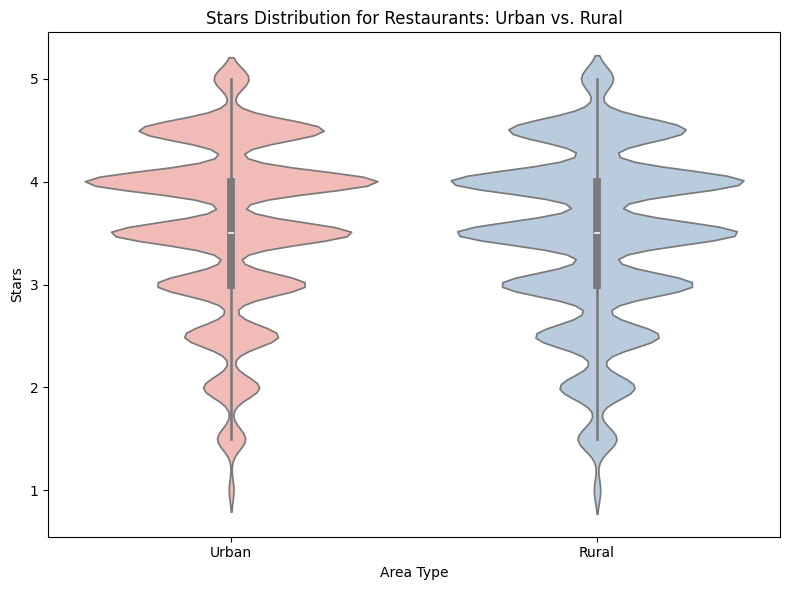

In [ ]:

restaurants_df = business_df[business_df["categories"].str.contains("Restaurants", na=False, case=False)].copy()
city_counts = restaurants_df["city"].value_counts()
restaurants_df["density"] = restaurants_df["city"].map(city_counts)
restaurants_df["area_type"] = restaurants_df["density"].apply(lambda x: "Urban" if x > 300 else "Rural")

plt.figure(figsize=(8, 6))
sns.violinplot(x="area_type", y="stars", data=restaurants_df, palette="Pastel1")
plt.xlabel("Area Type")
plt.ylabel("Stars")
plt.title("Stars Distribution for Restaurants: Urban vs. Rural")
plt.tight_layout()
plt.show()

<Figure size 1200x600 with 0 Axes>

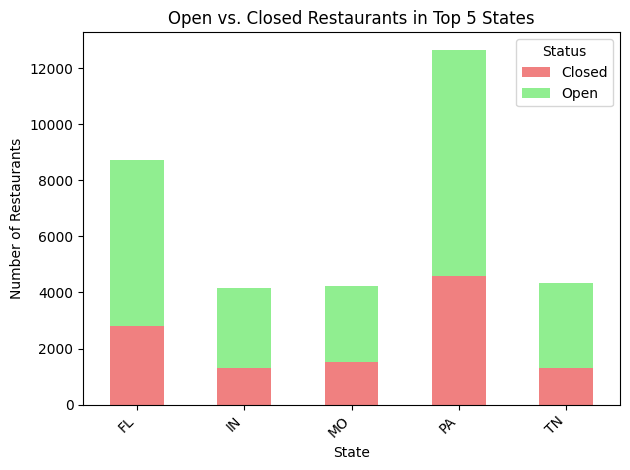

In [ ]:

restaurants_df = business_df[business_df["categories"].str.contains("Restaurants", na=False, case=False)].copy()

top_cities = restaurants_df["state"].value_counts().head(5).index
city_status = restaurants_df[restaurants_df["state"].isin(top_cities)].groupby(["state", "is_open"]).size().unstack()
city_status.columns = ["Closed", "Open"]
plt.figure(figsize=(12, 6))
city_status.plot(kind="bar", stacked=True, color=["lightcoral", "lightgreen"])
plt.xlabel("State")
plt.ylabel("Number of Restaurants")
plt.title("Open vs. Closed Restaurants in Top 5 States")
plt.xticks(rotation=45, ha="right")
plt.legend(title="Status")
plt.tight_layout()
plt.show()

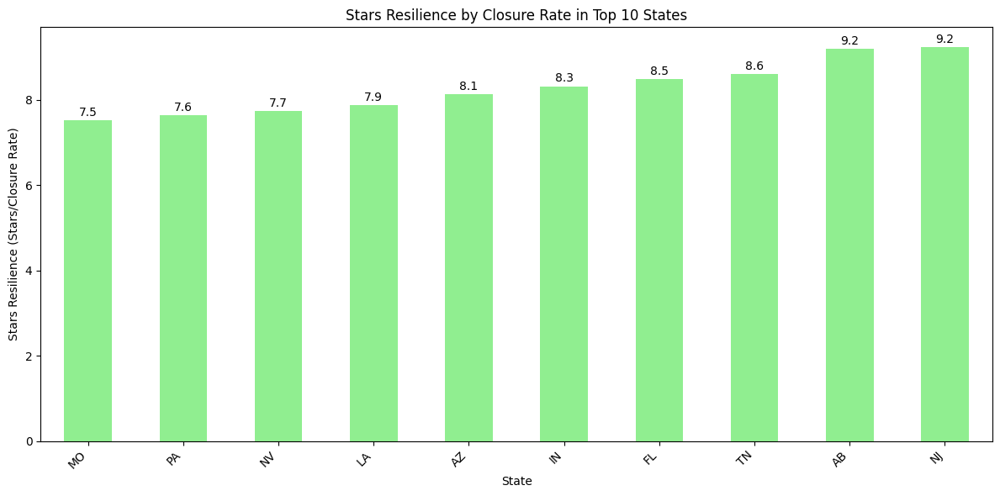

In [ ]:



import pandas as pd
import
restaurants_df = business_df[business_df["categories"].str.contains("Restaurants", na=False, case=False)].copy()

top_states = restaurants_df["state"].value_counts().head(10).index
state_data = restaurants_df[restaurants_df["state"].isin(top_states)]

state_stats = state_data.groupby("state").agg({
    "is_open": lambda x: (x == 0).mean(),
    "stars": "mean"
}).rename(columns={"is_open": "closure_rate"})
state_stats["resilience"] = state_stats["stars"] / (state_stats["closure_rate"] + 0.1)

plt.figure(figsize=(12, 6))
state_stats["resilience"].sort_values().plot(kind="bar", color="lightgreen")
plt.xlabel("State")
plt.ylabel("Stars Resilience (Stars/Closure Rate)")
plt.title("Stars Resilience by Closure Rate in Top 10 States")
plt.xticks(rotation=45, ha="right")
for i, v in enumerate(state_stats["resilience"].sort_values()):
    plt.text(i, v + 0.1, f"{v:.1f}", ha="center")
plt.tight_layout()
plt.show()

In [ ]:
import plotly.express as px

business_df_valid = business_df.dropna(subset=["latitude", "longitude", "stars"])

fig = px.scatter_mapbox(
    business_df_valid,
    lat="latitude",
    lon="longitude",
    hover_name="name",
    hover_data=["stars", "review_count", "city"],
    color="stars",
    color_continuous_scale=px.colors.sequential.Viridis,
    range_color=[1, 5],
    zoom=3,
    opacity=0.6,
    title="Geospatial Distribution of Business Ratings"
)

fig.update_layout(mapbox_style="open-street-map")
fig.show()

<ipython-input-73-7fd8bf1c412a>:31: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

<ipython-input-73-7fd8bf1c412a>:31: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

<ipython-input-73-7fd8bf1c412a>:31: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

<ipython-input-73-7fd8bf1c412a>:31: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to 

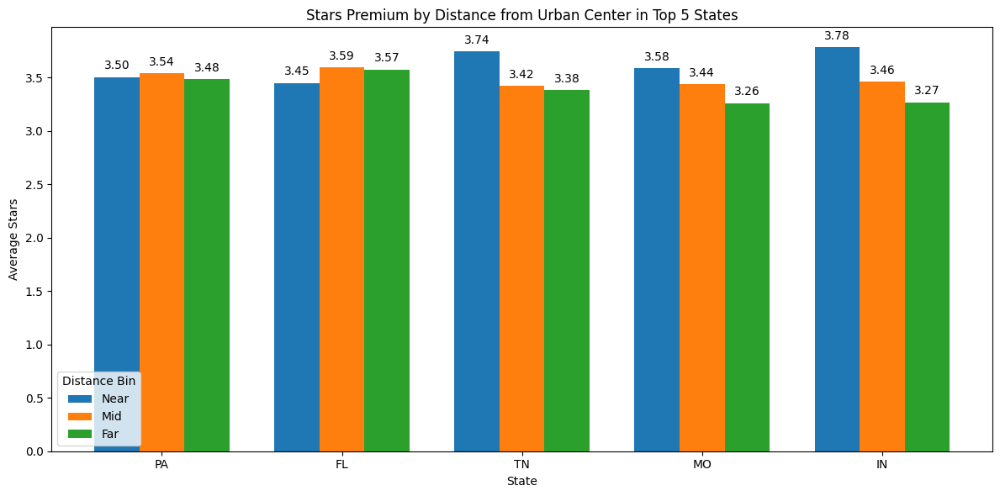

In [ ]:

from math import radians, sin, cos, sqrt, atan2

restaurants_df = business_df[business_df["categories"].str.contains("Restaurants", na=False, case=False)].copy()

def haversine(lat1, lon1, lat2, lon2):
    R = 6371
    dlat = radians(lat2 - lat1)
    dlon = radians(lon2 - lon1)
    a = sin(dlat/2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    return R * c

top_states = restaurants_df["state"].value_counts().head(5).index
state_data = restaurants_df[restaurants_df["state"].isin(top_states)].dropna(subset=["latitude", "longitude"]).copy()

state_distances = {}
for state in top_states:
    state_subset = state_data[state_data["state"] == state].copy()
    centroid_lat = state_subset["latitude"].mean()
    centroid_lon = state_subset["longitude"].mean()
    state_subset["distance"] = state_subset.apply(
        lambda row: haversine(row["latitude"], row["longitude"], centroid_lat, centroid_lon), axis=1
    )
    state_subset["distance_bin"] = pd.cut(state_subset["distance"], bins=[0, 5, 20, float("inf")], labels=["Near", "Mid", "Far"])
    state_distances[state] = state_subset.groupby("distance_bin")["stars"].mean()

distance_bins = ["Near", "Mid", "Far"]
bar_data = pd.DataFrame({state: [state_distances[state].get(bin, 0) for bin in distance_bins] for state in top_states}, index=distance_bins)

# Clustered bar chart
plt.figure(figsize=(12, 6))
bar_width = 0.25
x = range(len(top_states))
colors = ["#1f77b4", "#ff7f0e", "#2ca02c"]

for i, bin in enumerate(distance_bins):
    plt.bar(
        [pos + i * bar_width for pos in x],
        bar_data.loc[bin],
        width=bar_width,
        label=bin,
        color=colors[i]
    )
    for j, v in enumerate(bar_data.loc[bin]):
        if v > 0:
            plt.text(j + i * bar_width, v + 0.05, f"{v:.2f}", ha="center", va="bottom")

plt.xlabel("State")
plt.ylabel("Average Stars")
plt.title("Stars Premium by Distance from Urban Center in Top 5 States")
plt.xticks([pos + bar_width for pos in x], top_states)
plt.legend(title="Distance Bin")
plt.tight_layout()
plt.show()